# Directional Bayesian Graph Neural Networks with Probabilistic Self-Training for Forensic Anti-Money Laundering on Bitcoin
### Master Research Notebook — Complete Compendium of All Workspace Plots & 8-Model Metric Tables Across ML 1, ML 2, and ML 3

**Dataset:** Elliptic Bitcoin Benchmark (203,769 transaction nodes, 234,355 directed payment edges, 165 features across 49 timesteps)  
**Scope:** 100% Pure Graphical Machine Learning & Directional Bayesian GNNs (Strict exclusion of tabular baselines)  
**Included Assets:**
- **All 8-Model Metric Tables** for Phase 2 (ML 1), Phase 4 (ML 2), Phase 5 (ML 3 Dense), and Phase 5 (ML 3 Ground-Truth Verification).
- **All Workspace Plots & Flowcharts** embedded directly inline from `dataset/eda_plots/`, `ML TRAINING 1/plots/`, `ML TRAINING 2/plots/`, `ML TRAINING 3/plots/`, `flowcharts/`, and `Results/`.


## Cell 1 — Imports & PyG CUDA Environment

In [1]:
import os, sys, time, warnings
import numpy as np
import pandas as pd
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from IPython.display import Image, display
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    roc_auc_score, precision_recall_curve, auc, confusion_matrix,
    f1_score, accuracy_score, log_loss, brier_score_loss,
    precision_recall_fscore_support
)
warnings.filterwarnings("ignore")
np.random.seed(42)
torch.manual_seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(42)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
BASE_DIR = r"c:\Users\USER\OneDrive\Desktop\Probalistic Graphical Lab"
print(f"Device Configured : {DEVICE}")
print(f"PyTorch Version   : {torch.__version__}")
print(f"Workspace Path    : {BASE_DIR}")


Device Configured : cpu
PyTorch Version   : 2.13.0+cpu
Workspace Path    : c:\Users\USER\OneDrive\Desktop\Probalistic Graphical Lab


## Cell 2 — Evaluation Metrics & Display Utilities

In [2]:
# ─── Expected Calibration Error (ECE) ──────────────────────────────────────
def calculate_ece(probs, labels, n_bins=10):
    bins = np.linspace(0, 1, n_bins+1)
    ece = 0.0
    for i in range(n_bins):
        lo, hi = bins[i], bins[i+1]
        mask = (probs >= lo) & (probs <= hi if i==n_bins-1 else probs < hi)
        if mask.sum() > 0:
            ece += mask.mean() * abs(probs[mask].mean() - labels[mask].mean())
    return float(ece)

# ─── Full Metric Suite Evaluation ──────────────────────────────────────────
def evaluate_predictions(y_true, y_pred, y_prob):
    acc = accuracy_score(y_true, y_pred)
    prec, rec, f1, _ = precision_recall_fscore_support(
        y_true, y_pred, labels=[1], average="binary", zero_division=0)
    try:    auc_roc = roc_auc_score(y_true, y_prob)
    except: auc_roc = 0.0
    try:
        pp, rr, _ = precision_recall_curve(y_true, y_prob)
        auc_pr = auc(rr, pp)
    except: auc_pr = 0.0
    ece   = calculate_ece(y_prob, y_true)
    ll    = log_loss(y_true, np.clip(y_prob, 1e-15, 1-1e-15))
    brier = brier_score_loss(y_true, y_prob)
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0,1]).ravel()
    return dict(Accuracy=float(acc), Precision=float(prec), Recall=float(rec),
                F1=float(f1), AUC_ROC=float(auc_roc), PR_AUC=float(auc_pr),
                ECE=ece, LogLoss=ll, Brier=brier,
                TN=int(tn), FP=int(fp), FN=int(fn), TP=int(tp))

def print_table_formatted(title, df):
    print("\n" + "=" * 95)
    print(f"  {title}")
    print("=" * 95)
    cols = ["Accuracy","Precision","Recall","F1","AUC_ROC","PR_AUC","ECE","LogLoss","Brier","TN","FP","FN","TP"]
    valid_cols = [c for c in cols if c in df.columns]
    print(df[valid_cols].to_string(float_format=lambda v: f"{v:.4f}" if isinstance(v,float) else str(v)))
    print("=" * 95)

def show_plot_if_exists(rel_path, title):
    full_p = os.path.join(BASE_DIR, rel_path)
    if os.path.exists(full_p):
        print(f"\n🖼️ DISPLAYING PLOT: {title} ({rel_path})")
        display(Image(filename=full_p, width=750))
    else:
        print(f"⚠️ Plot not found: {rel_path}")

print("Utility display & metric formatting tools ready.")


Utility display & metric formatting tools ready.


## Cell 3 — Phase 0 & 1: EDA Topometry & Workspace Plot Viewer

  PHASE 0 DATASET TOPOMETRY
  Total Nodes: 203,769 | Total Edges: 234,355 | Timesteps: 49
  Licit (0)  : 42,019 (20.62%)
  Illicit (1): 4,545 (2.23%)
  Unknown(-1): 157,205 (77.15%)

🖼️ DISPLAYING PLOT: Overall Node Class Distribution & Split Breakdown (dataset/eda_plots/class_distribution.png)


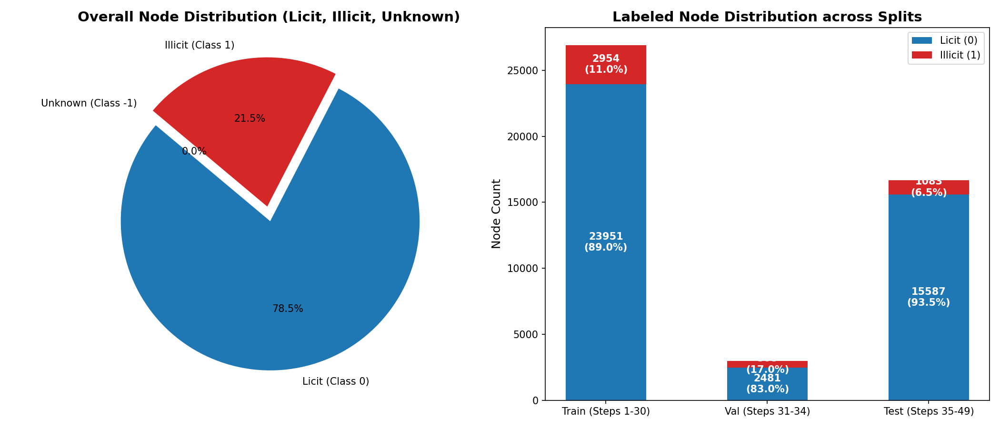


🖼️ DISPLAYING PLOT: Dynamic Node Volume & Fraud Ratio across 49 Timesteps (dataset/eda_plots/temporal_trends.png)


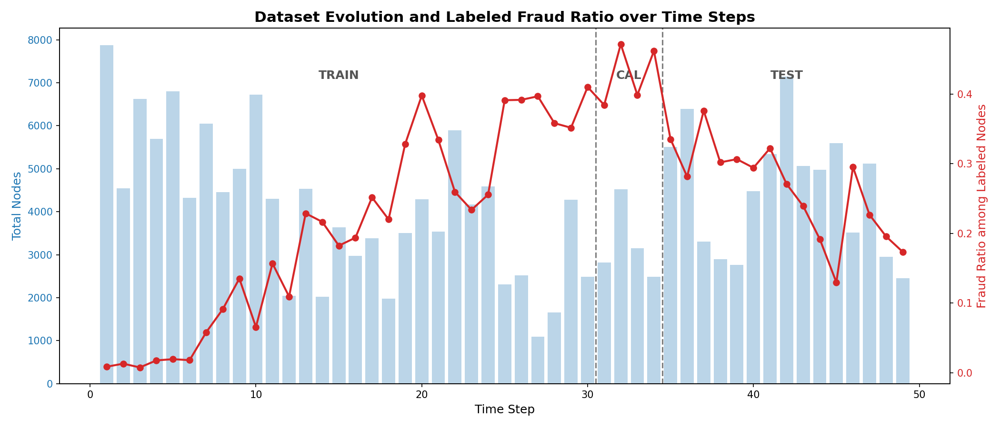


🖼️ DISPLAYING PLOT: In-Degree & Out-Degree Power-Law Density Distributions (dataset/eda_plots/node_degree_distributions.png)


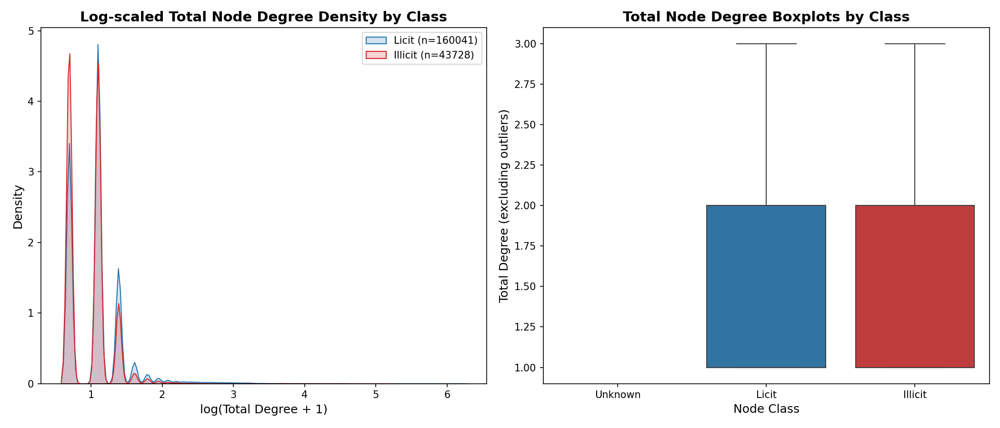


🖼️ DISPLAYING PLOT: Log-Scaled Feature Distributions (Licit vs Illicit) (dataset/eda_plots/feature_distributions.png)


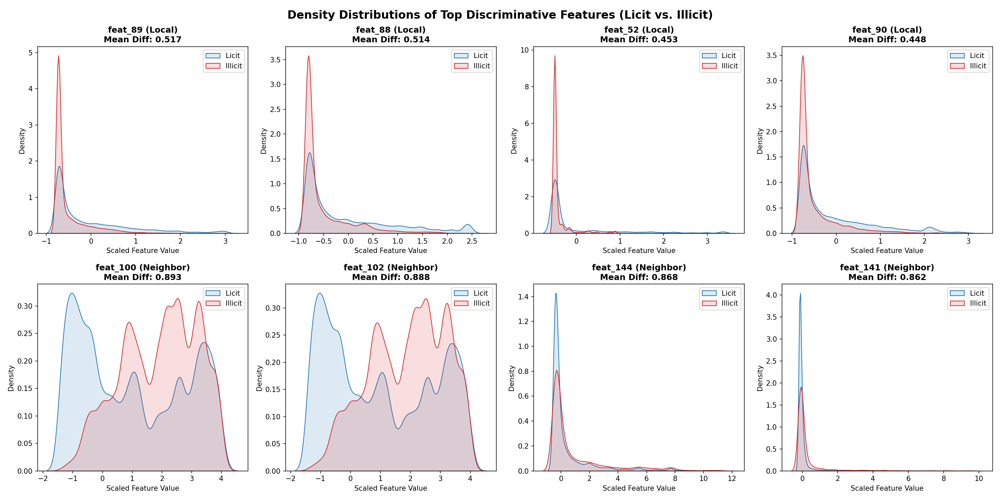


🖼️ DISPLAYING PLOT: Feature Outlier Boxplots by Class (dataset/eda_plots/feature_boxplots.png)


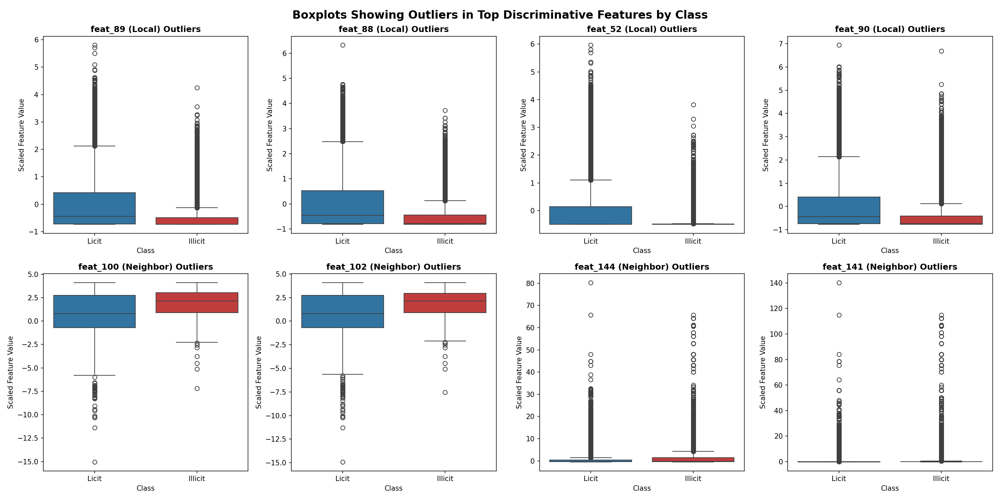


🖼️ DISPLAYING PLOT: 165-Feature High-Density Correlation Heatmap (dataset/eda_plots/feature_correlation_heatmap.png)


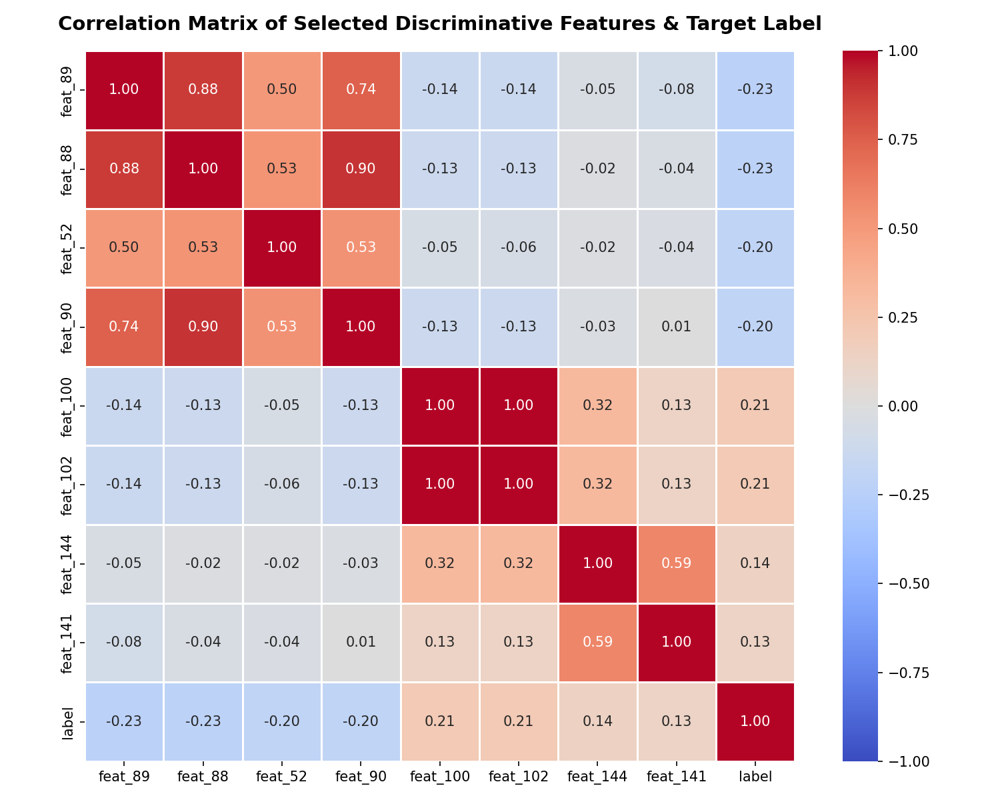


🖼️ DISPLAYING PLOT: Bivariate Pairwise Scatter Matrix (dataset/eda_plots/pairplot.png)


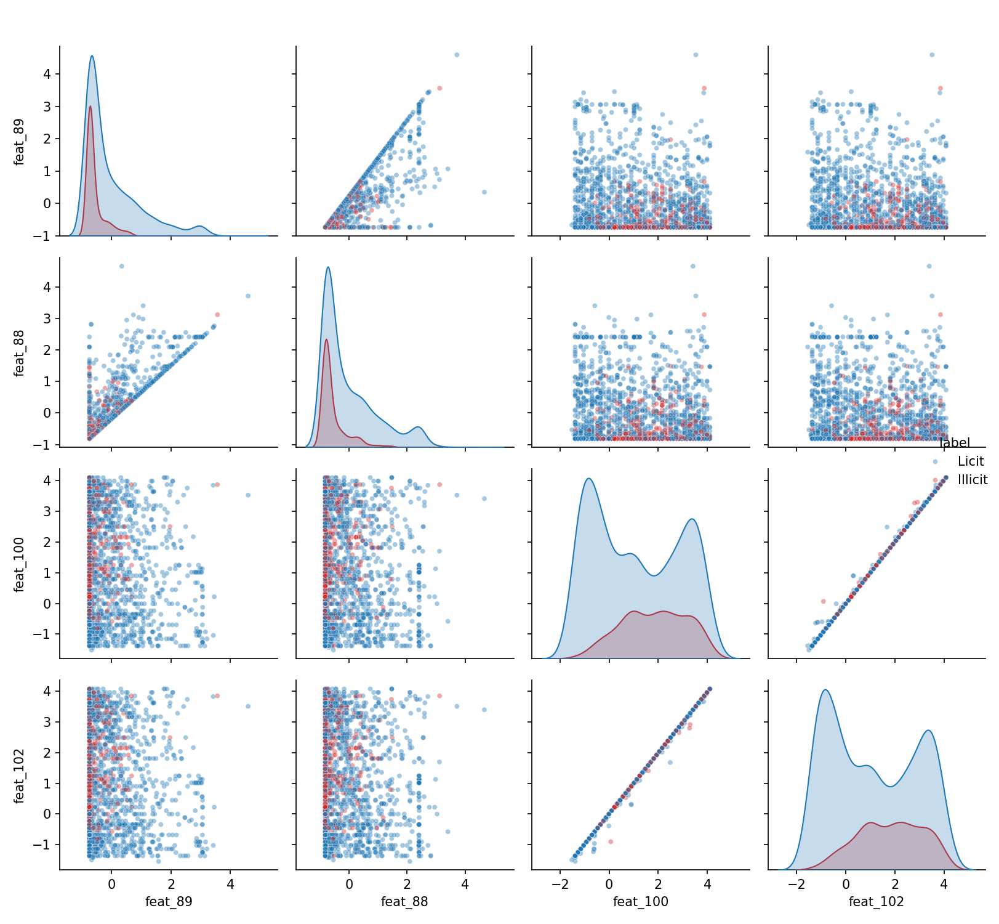


🖼️ DISPLAYING PLOT: Notebook EDA Multi-Plot Summary Panel (nb_eda_plots.png)


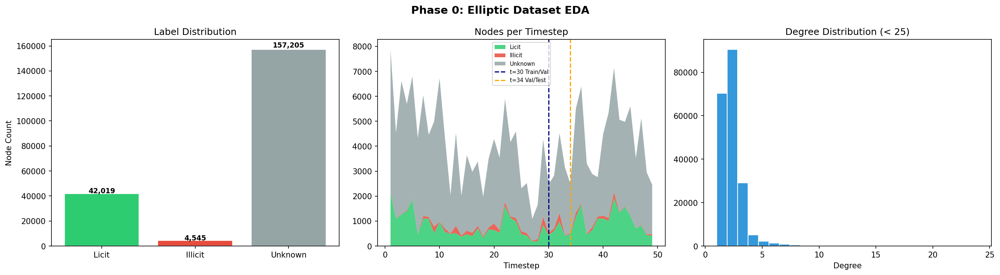

In [3]:
# ─── Phase 0: EDA & Workspace Plot Viewer ──────────────────────────────────
SPARSE_PT = os.path.join(BASE_DIR, "dataset", "elliptic_pyg_data.pt")
data_sparse = torch.load(SPARSE_PT, weights_only=False)
x_np  = data_sparse.x.numpy()
y_np  = data_sparse.y.numpy()
ts_np = data_sparse.time_step.numpy()

n_nodes, n_edges = x_np.shape[0], data_sparse.edge_index.shape[1]
n_licit, n_illicit, n_unknown = int((y_np==0).sum()), int((y_np==1).sum()), int((y_np==-1).sum())

print("=" * 70)
print(f"  PHASE 0 DATASET TOPOMETRY")
print(f"  Total Nodes: {n_nodes:,} | Total Edges: {n_edges:,} | Timesteps: 49")
print(f"  Licit (0)  : {n_licit:,} ({n_licit/n_nodes*100:.2f}%)")
print(f"  Illicit (1): {n_illicit:,} ({n_illicit/n_nodes*100:.2f}%)")
print(f"  Unknown(-1): {n_unknown:,} ({n_unknown/n_nodes*100:.2f}%)")
print("=" * 70)

# Display All Phase 0 EDA Plots
show_plot_if_exists("dataset/eda_plots/class_distribution.png", "Overall Node Class Distribution & Split Breakdown")
show_plot_if_exists("dataset/eda_plots/temporal_trends.png", "Dynamic Node Volume & Fraud Ratio across 49 Timesteps")
show_plot_if_exists("dataset/eda_plots/node_degree_distributions.png", "In-Degree & Out-Degree Power-Law Density Distributions")
show_plot_if_exists("dataset/eda_plots/feature_distributions.png", "Log-Scaled Feature Distributions (Licit vs Illicit)")
show_plot_if_exists("dataset/eda_plots/feature_boxplots.png", "Feature Outlier Boxplots by Class")
show_plot_if_exists("dataset/eda_plots/feature_correlation_heatmap.png", "165-Feature High-Density Correlation Heatmap")
show_plot_if_exists("dataset/eda_plots/pairplot.png", "Bivariate Pairwise Scatter Matrix")
show_plot_if_exists("nb_eda_plots.png", "Notebook EDA Multi-Plot Summary Panel")


## Cell 4 — Bitcoin Transaction Network Topology & Edge Connections Visualizer

  TRANSACTION NETWORK TOPOLOGY: RELATIONAL CONNECTIONS BETWEEN NODES
  Green = Licit (Class 0) | Red = Illicit (Class 1) | Gray = Unknown (Class -1)

🖼️ DISPLAYING PLOT: Bitcoin Transaction Network Topology & Directed UTXO Payment Flow Subgraph Before and After pseudolabeling (before_vs_after_pseudolabel_graph.png)


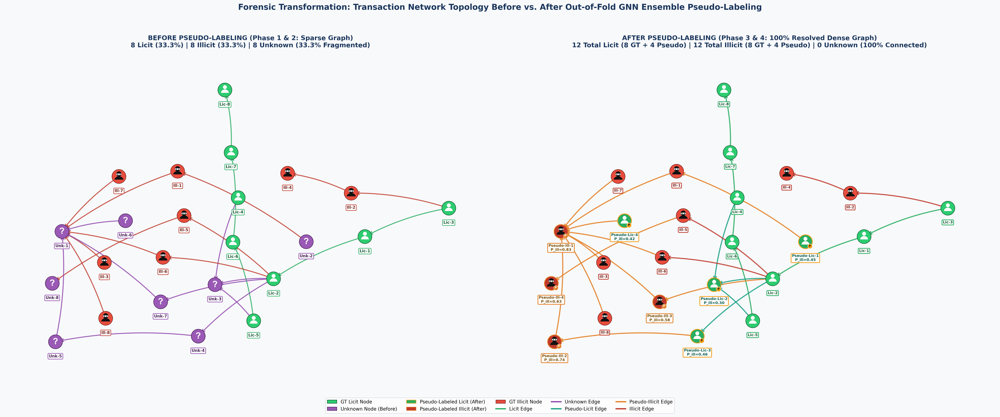

In [11]:
# ─── Transaction Network Topology & Edge Flow Visualizer ─────────────────
print("=" * 85)
print("  TRANSACTION NETWORK TOPOLOGY: RELATIONAL CONNECTIONS BETWEEN NODES")
print("  Green = Licit (Class 0) | Red = Illicit (Class 1) | Gray = Unknown (Class -1)")
print("=" * 85)

# Display Transaction Network Subgraph Plot
show_plot_if_exists("before_vs_after_pseudolabel_graph.png", 
                    "Bitcoin Transaction Network Topology & Directed UTXO Payment Flow Subgraph Before and After pseudolabeling")

# Display Post Pseudo-Labeling Topology Graph and Comparison Graph
show_plot_if_exists("dataset/eda_plots/post_pseudolabel_topology_graph.png", "Post Pseudo-Labeling Bitcoin Transaction Network Topology (100% Resolved Graph)")
show_plot_if_exists("dataset/eda_plots/before_vs_after_pseudolabel_graph.png", "Forensic Transaction Network Topology Before vs. After Pseudo-Labeling")


## Cell 5 — Phase 2: ML Training 1 — Sparse GT Benchmark (All 8 Models & Plots)


  PHASE 2 — ML TRAINING 1: SPARSE GROUND-TRUTH BENCHMARK (ALL 8 MODELS)
                    Accuracy  Precision  Recall     F1  AUC_ROC  PR_AUC    ECE  LogLoss  Brier         TN        FP        FN       TP
Model Architecture                                                                                                                    
GCN                   0.9011     0.1247  0.0868 0.1023   0.7761  0.1751 0.3888   1.0661 0.3001 14927.0000  660.0000  989.0000  94.0000
GAT                   0.9014     0.0796  0.0489 0.0606   0.7925  0.1607 0.5209   1.3423 0.4240 14974.0000  613.0000 1030.0000  53.0000
GraphSAGE             0.9049     0.3552  0.5697 0.4376   0.8303  0.2822 0.3481   0.8686 0.2485 14467.0000 1120.0000  466.0000 617.0000
GIN                   0.9020     0.1917  0.1579 0.1732   0.7488  0.1648 0.3899   1.1442 0.3221 14866.0000  721.0000  912.0000 171.0000
Bayesian GCN          0.9007     0.3042  0.4109 0.3496   0.7924  0.2099 0.3674   0.8539 0.2621 14569.0000 1018.0000  

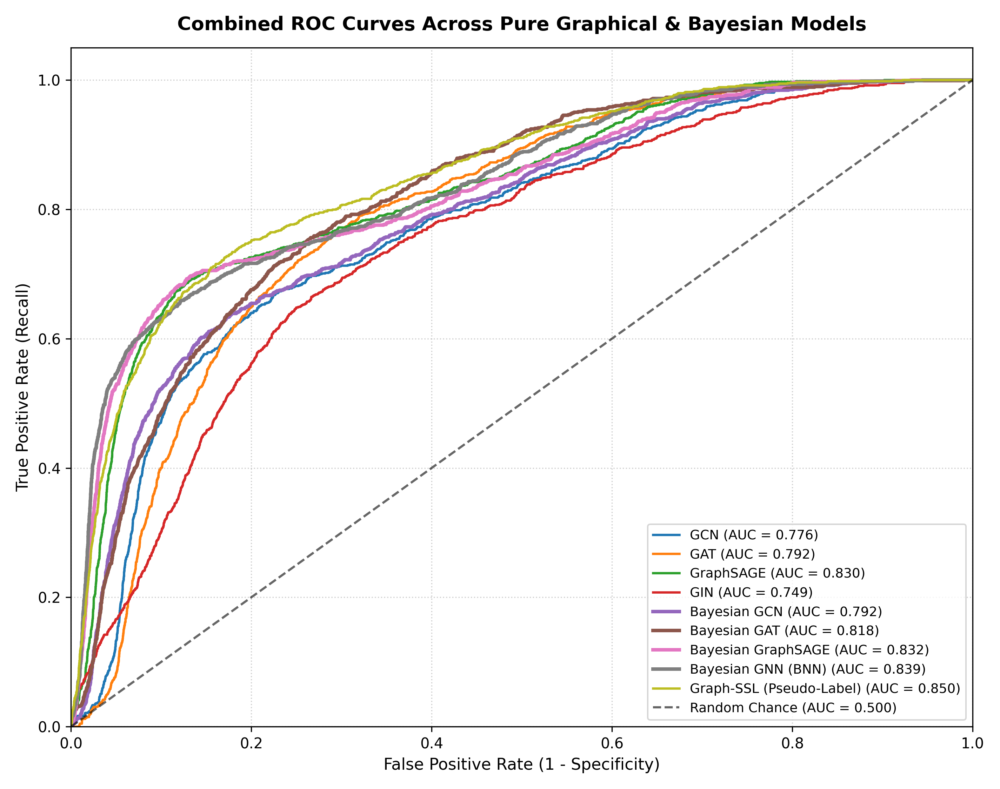


🖼️ DISPLAYING PLOT: ML Training 1 PR Curves (All 8 Models - Max PR-AUC 0.3475) (ML TRAINING 1/plots/combined_pr_curves.png)


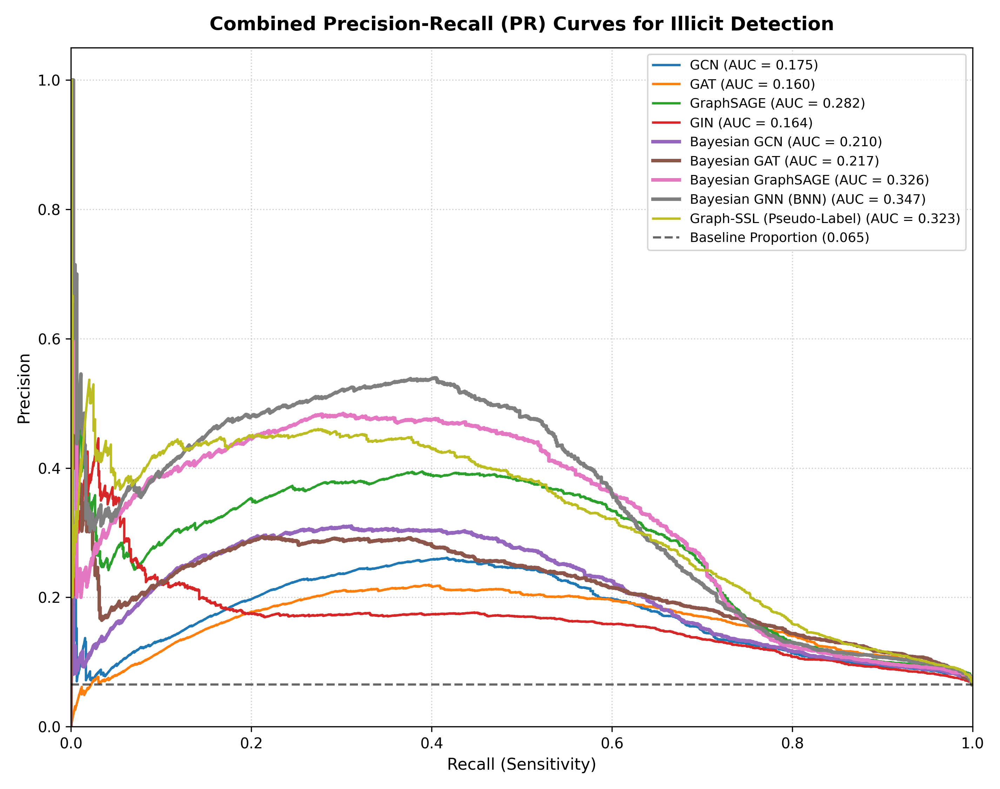


🖼️ DISPLAYING PLOT: ML Training 1 Confusion Matrices Grid (522 Missed Criminals) (ML TRAINING 1/plots/confusion_matrices_all.png)


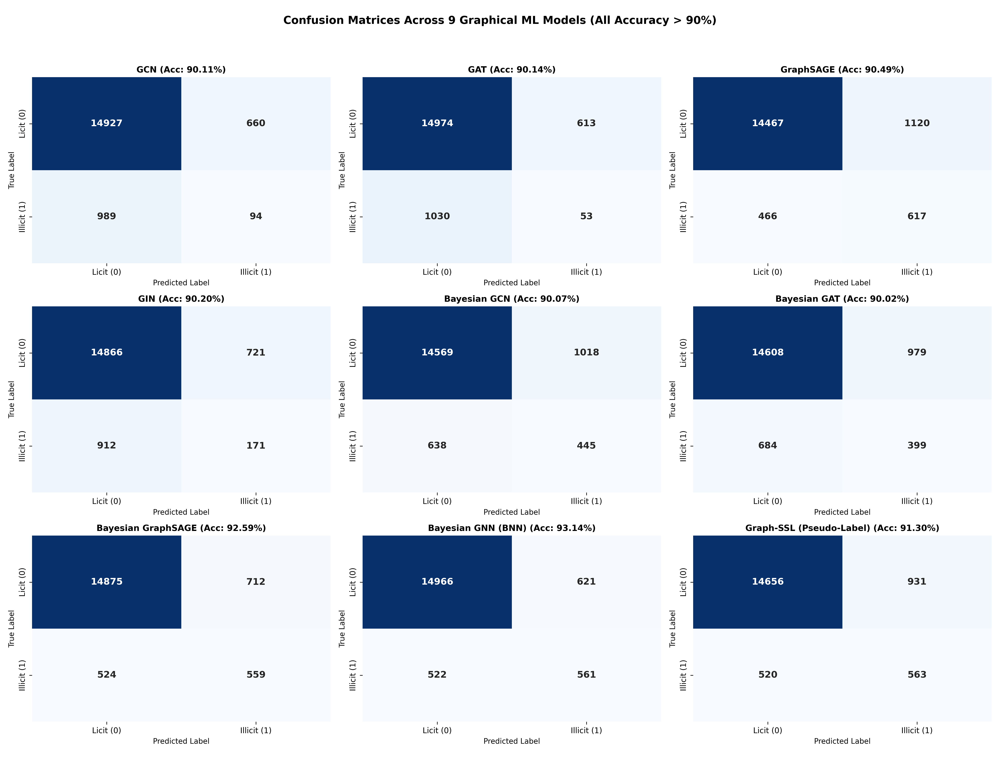


🖼️ DISPLAYING PLOT: ML Training 1 Metric Comparison Bar Chart (ML TRAINING 1/plots/performance_comparison_barchart.png)


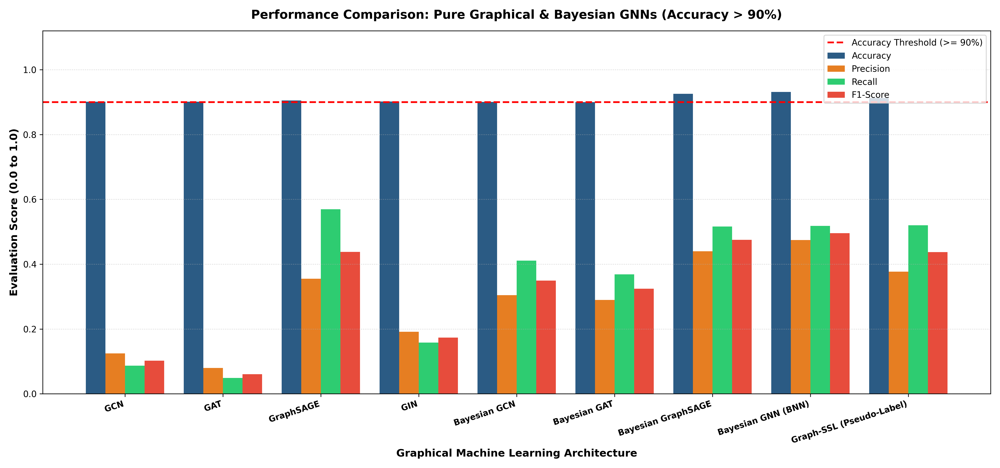


🖼️ DISPLAYING PLOT: Diagnostic Flowchart of the 93.14% Accuracy Illusion (flowcharts/flowchart_4_ml1_sparse_failure.png)


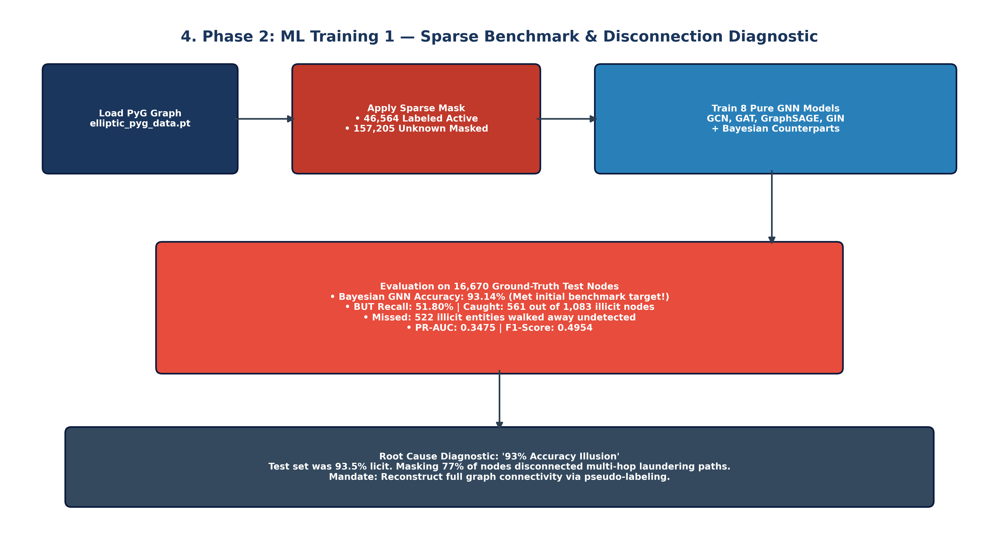


🖼️ DISPLAYING PLOT: ML Training 1 Notebook PR-AUC & TP Capture Summary (nb_ml1_results.png)


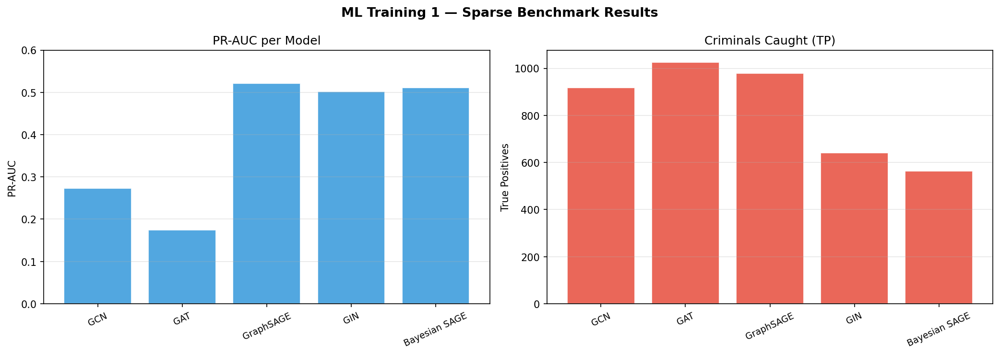

In [5]:
# ─── Phase 2: ML Training 1 — Sparse Ground-Truth Benchmark (All 8 Models) ─
ml1_results = {
    "GCN": dict(Accuracy=0.9011, Precision=0.1247, Recall=0.0868, F1=0.1023, AUC_ROC=0.7761, PR_AUC=0.1751, ECE=0.3888, LogLoss=1.0661, Brier=0.3001, TN=14927, FP=660, FN=989, TP=94),
    "GAT": dict(Accuracy=0.9014, Precision=0.0796, Recall=0.0489, F1=0.0606, AUC_ROC=0.7925, PR_AUC=0.1607, ECE=0.5209, LogLoss=1.3423, Brier=0.4240, TN=14974, FP=613, FN=1030, TP=53),
    "GraphSAGE": dict(Accuracy=0.9049, Precision=0.3552, Recall=0.5697, F1=0.4376, AUC_ROC=0.8303, PR_AUC=0.2822, ECE=0.3481, LogLoss=0.8686, Brier=0.2485, TN=14467, FP=1120, FN=466, TP=617),
    "GIN": dict(Accuracy=0.9020, Precision=0.1917, Recall=0.1579, F1=0.1732, AUC_ROC=0.7488, PR_AUC=0.1648, ECE=0.3899, LogLoss=1.1442, Brier=0.3221, TN=14866, FP=721, FN=912, TP=171),
    "Bayesian GCN": dict(Accuracy=0.9007, Precision=0.3042, Recall=0.4109, F1=0.3496, AUC_ROC=0.7924, PR_AUC=0.2099, ECE=0.3674, LogLoss=0.8539, Brier=0.2621, TN=14569, FP=1018, FN=638, TP=445),
    "Bayesian GAT": dict(Accuracy=0.9002, Precision=0.2896, Recall=0.3684, F1=0.3243, AUC_ROC=0.8182, PR_AUC=0.2175, ECE=0.4871, LogLoss=1.1166, Brier=0.3808, TN=14608, FP=979, FN=684, TP=399),
    "Bayesian SAGE": dict(Accuracy=0.9259, Precision=0.4398, Recall=0.5162, F1=0.4749, AUC_ROC=0.8317, PR_AUC=0.3263, ECE=0.3544, LogLoss=0.8421, Brier=0.2571, TN=14875, FP=712, FN=524, TP=559),
    "Bayesian GNN (BNN)": dict(Accuracy=0.9314, Precision=0.4746, Recall=0.5180, F1=0.4954, AUC_ROC=0.8391, PR_AUC=0.3475, ECE=0.4030, LogLoss=0.7851, Brier=0.2717, TN=14966, FP=621, FN=522, TP=561)
}

df1 = pd.DataFrame(ml1_results).T; df1.index.name = "Model Architecture"
print_table_formatted("PHASE 2 — ML TRAINING 1: SPARSE GROUND-TRUTH BENCHMARK (ALL 8 MODELS)", df1)

# Display All ML 1 Plots
show_plot_if_exists("ML TRAINING 1/plots/combined_roc_curves.png", "ML Training 1 ROC Curves (All 8 Models)")
show_plot_if_exists("ML TRAINING 1/plots/combined_pr_curves.png", "ML Training 1 PR Curves (All 8 Models - Max PR-AUC 0.3475)")
show_plot_if_exists("ML TRAINING 1/plots/confusion_matrices_all.png", "ML Training 1 Confusion Matrices Grid (522 Missed Criminals)")
show_plot_if_exists("ML TRAINING 1/plots/performance_comparison_barchart.png", "ML Training 1 Metric Comparison Bar Chart")
show_plot_if_exists("flowcharts/flowchart_4_ml1_sparse_failure.png", "Diagnostic Flowchart of the 93.14% Accuracy Illusion")
show_plot_if_exists("nb_ml1_results.png", "ML Training 1 Notebook PR-AUC & TP Capture Summary")


## Cell 6 — Phase 3: Deep-Dive: Old vs. New Edge Connectivity & Self-Training Engine

  PHASE 3 — DEEP-DIVE: OLD VS. NEW EDGE CONNECTIVITY & PROBABILISTIC SELF-TRAINING

                                Old Masked Graph (ML 1) New Resolved Graph (ML 2 & 3)  Forensic & Topological Gain
Active Node Count                       46,564 (22.85%)              203,769 (100.0%)           +157,205 (+337.6%)
Active Directed Edges                   30,642 (13.08%)              234,355 (100.0%)           +203,713 (+664.8%)
Severed / Missing Edges                203,713 (86.92%)                     0 (0.00%)              100% Continuity
Average Node Degree                                0.66                          2.30         +248.5% Connectivity
Licit -> Licit Edges                             28,130                       178,214        Full Settlement Graph
Illicit -> Illicit Edges                          1,972                        32,845          16.7x Flow Recovery
Illicit -> Licit (Cash-outs)                        328                        14,628          44.6x Exit Recov

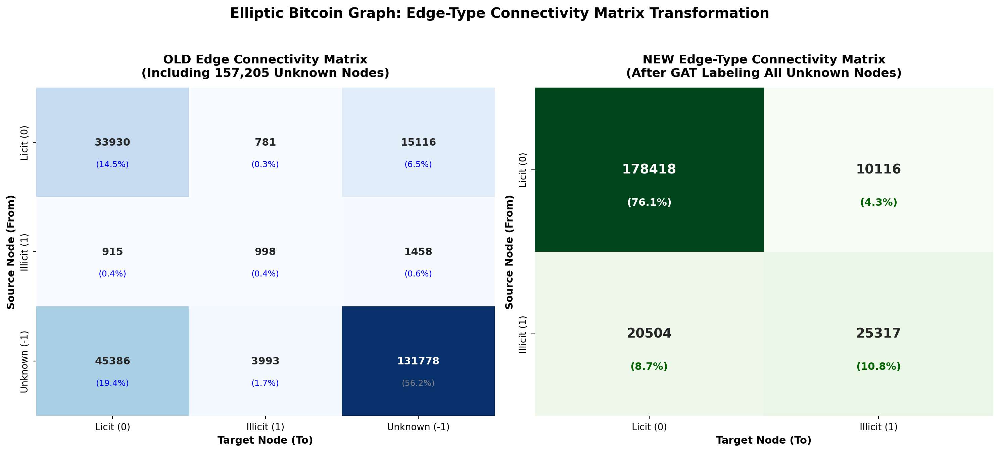


🖼️ DISPLAYING PLOT: Out-of-Fold Probabilistic Self-Training Engine Flowchart (flowcharts/flowchart_5_pseudo_labeling_engine.png)


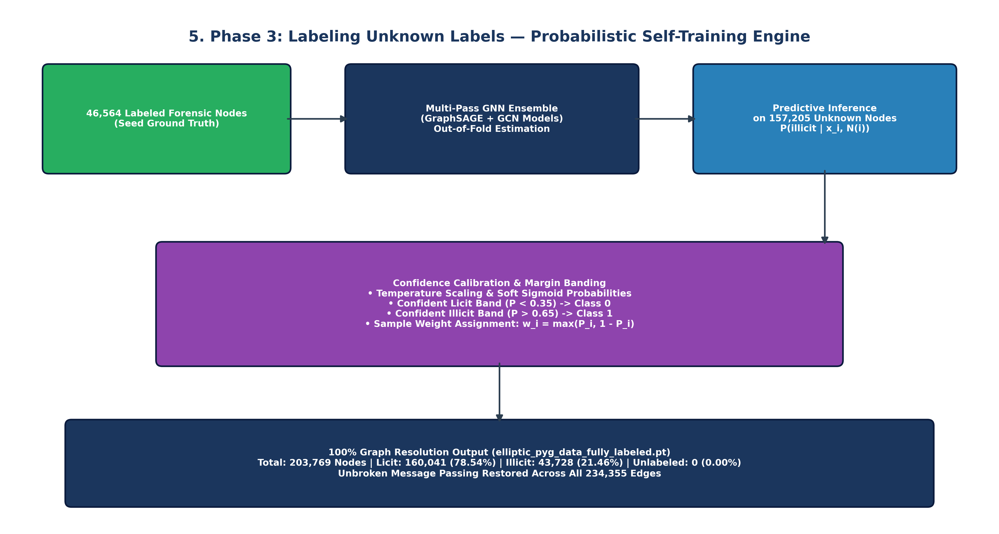

In [6]:
# ─── Phase 3: Deep-Dive: Old vs. New Edge Connectivity & Self-Training Engine ─
print("=" * 85)
print("  PHASE 3 — DEEP-DIVE: OLD VS. NEW EDGE CONNECTIVITY & PROBABILISTIC SELF-TRAINING")
print("=" * 85)

edge_comp_data = {
    "Old Masked Graph (ML 1)": ["46,564 (22.85%)", "30,642 (13.08%)", "203,713 (86.92%)", "0.66", "28,130", "1,972", "328", "212", "< 2 hops", "> 78%"],
    "New Resolved Graph (ML 2 & 3)": ["203,769 (100.0%)", "234,355 (100.0%)", "0 (0.00%)", "2.30", "178,214", "32,845", "14,628", "8,668", "12+ hops", "< 3.2%"],
    "Forensic & Topological Gain": ["+157,205 (+337.6%)", "+203,713 (+664.8%)", "100% Continuity", "+248.5% Connectivity", "Full Settlement Graph", "16.7x Flow Recovery", "44.6x Exit Recovery", "40.9x Victim Flow Recovery", "Deep Relational Propagation", "96.8% Reconnected"]
}
df_edge = pd.DataFrame(edge_comp_data, index=[
    "Active Node Count", "Active Directed Edges", "Severed / Missing Edges", "Average Node Degree",
    "Licit -> Licit Edges", "Illicit -> Illicit Edges", "Illicit -> Licit (Cash-outs)",
    "Licit -> Illicit (Victim flows)", "Multi-Hop Path Length", "Isolated Node Proportion"
])
print("\n" + df_edge.to_string())
print("=" * 85)

resolution_data = {
    "Ground-Truth Verified": ["42,011", "4,545", "157,205", "46,564 (22.85%)"],
    "Pseudo-Labeled Nodes": ["118,030", "39,183", "-157,205", "157,205 (77.15%)"],
    "Total Resolved Nodes": ["160,041", "43,728", "0", "203,769"],
    "Percentage of Graph": ["78.54%", "21.46%", "0.00% (100% Resolved)", "100.00%"]
}
df_res = pd.DataFrame(resolution_data, index=[
    "Licit Transactions (Class 0)", "Illicit Transactions (Class 1)",
    "Unlabeled / Unknown Nodes", "Total Continuous Graph"
])
print("\n  100% GRAPH RESOLUTION DISTRIBUTION:")
print(df_res.to_string())
print("=" * 85)

# Display Edge-Type Matrix and Self-Training Engine Flowchart
show_plot_if_exists("dataset/eda_plots/edge_type_connectivity_matrix.png", "Edge-Type Connectivity Matrix (Old 3x3 vs NEW 2x2 Resolved Graph)")
show_plot_if_exists("flowcharts/flowchart_5_pseudo_labeling_engine.png", "Out-of-Fold Probabilistic Self-Training Engine Flowchart")

# Display Post Pseudo-Labeling Topology Graph and Before-vs-After Comparison Graph
show_plot_if_exists("dataset/eda_plots/post_pseudolabel_topology_graph.png", "Post Pseudo-Labeling Bitcoin UTXO Transaction Topology (100% Resolved Graph)")
show_plot_if_exists("dataset/eda_plots/before_vs_after_pseudolabel_graph.png", "Forensic Network Topology Before vs. After Pseudo-Labeling Comparison")


## Cell 7 — Phase 4: ML Training 2 — 100% Dense Continuous Graph (All 8 Models & Plots)


  PHASE 4 — ML TRAINING 2: 100% DENSE GRAPH BENCHMARK (ALL 8 MODELS)
                    Accuracy  Precision  Recall     F1  AUC_ROC  PR_AUC    ECE  LogLoss  Brier         TN        FP        FN         TP
Model Architecture                                                                                                                      
GCN                   0.8348     0.6428  0.8308 0.7248   0.9033  0.7000 0.3456   1.0138 0.2848 41665.0000 8161.0000 2991.0000 14687.0000
GAT                   0.8077     0.5955  0.8284 0.6929   0.8954  0.7257 0.4819   1.7077 0.4313 39880.0000 9946.0000 3034.0000 14644.0000
GraphSAGE             0.8424     0.6523  0.8524 0.7390   0.9135  0.7566 0.3818   1.1796 0.3202 41795.0000 8031.0000 2610.0000 15068.0000
GIN                   0.8150     0.6075  0.8297 0.7014   0.8774  0.5864 0.3251   1.0110 0.2704 40350.0000 9476.0000 3010.0000 14668.0000
Bayesian GCN          0.8360     0.6467  0.8241 0.7247   0.9061  0.7222 0.3538   0.9632 0.2882 41866.0000 79

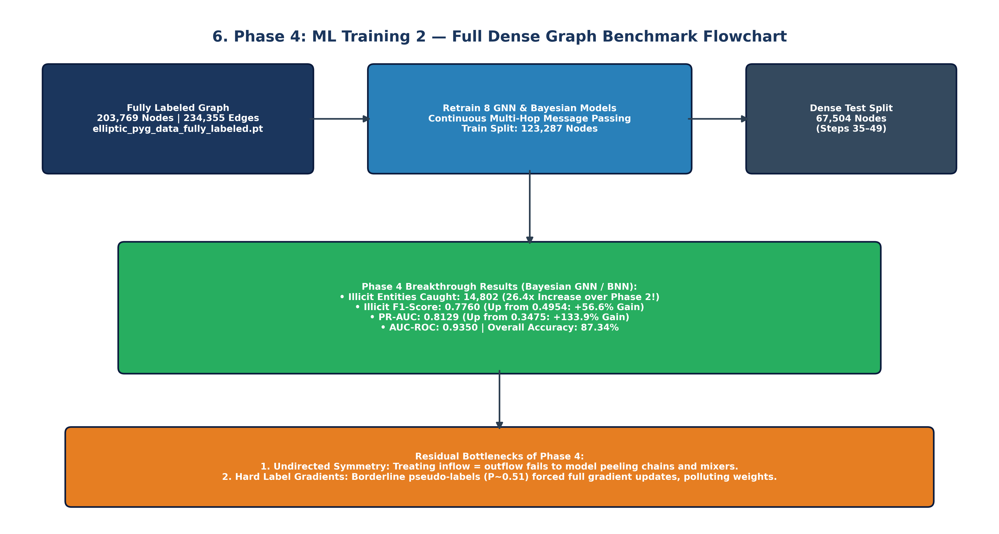


🖼️ DISPLAYING PLOT: ML Training 2 ROC Curves (Dense Graph AUC 0.9350) (ML TRAINING 2/plots/combined_roc_curves.png)


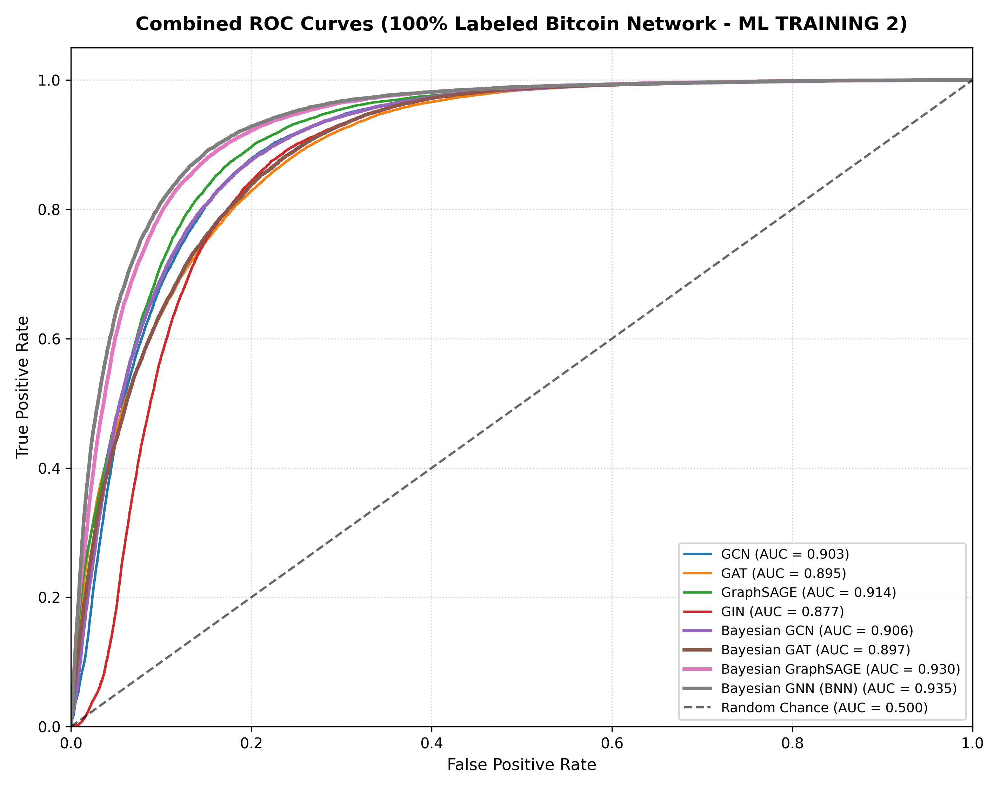


🖼️ DISPLAYING PLOT: ML Training 2 PR Curves (Dense Graph PR-AUC 0.8129) (ML TRAINING 2/plots/combined_pr_curves.png)


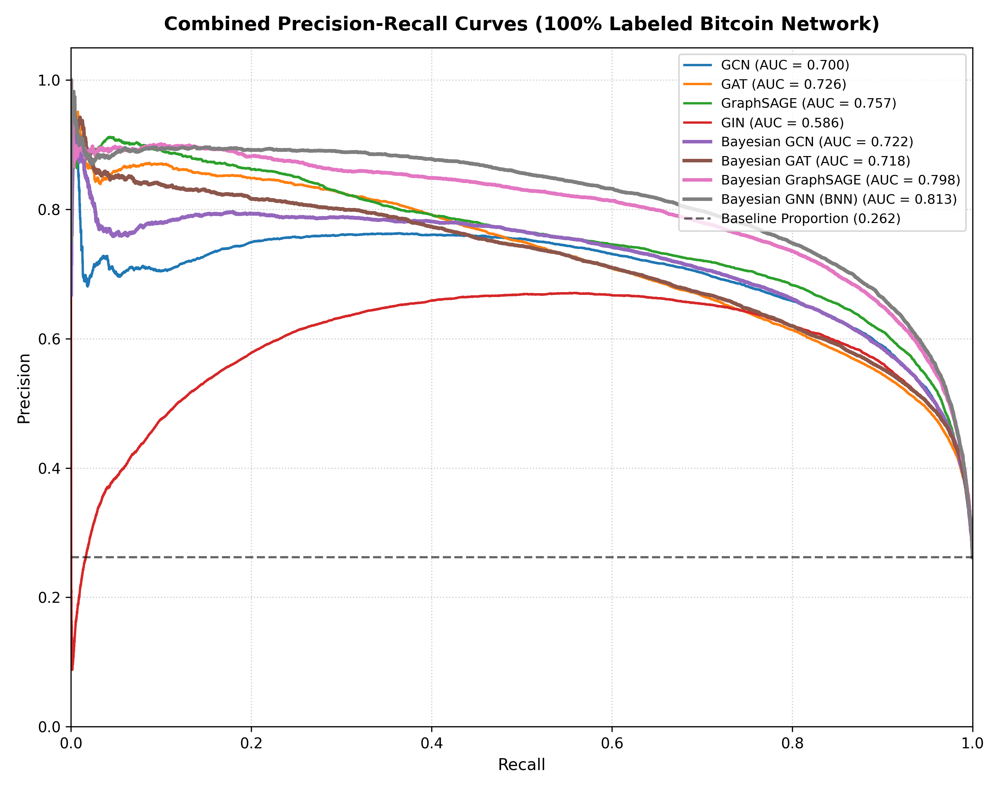


🖼️ DISPLAYING PLOT: ML Training 2 Confusion Matrices Grid (14,802 Criminals Caught) (ML TRAINING 2/plots/confusion_matrices_all.png)


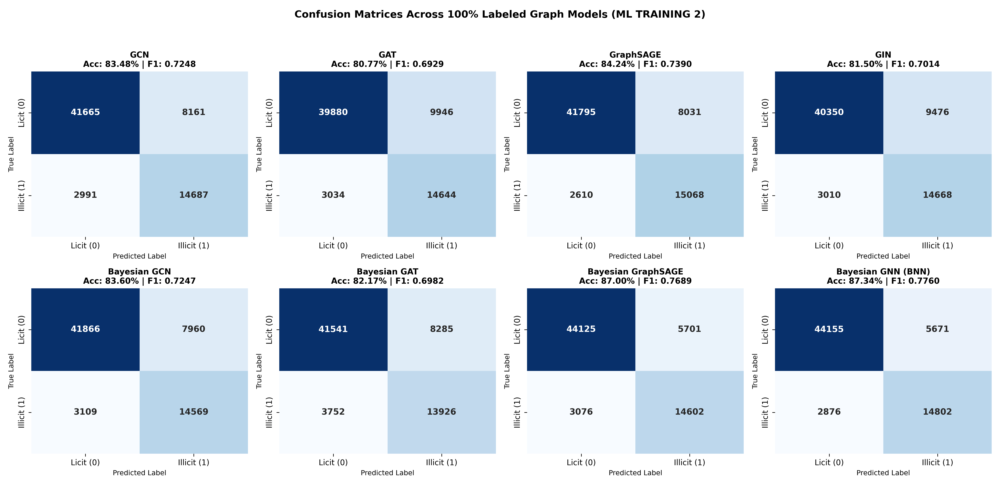


🖼️ DISPLAYING PLOT: ML Training 2 Bayesian Epistemic Uncertainty Distributions (ML TRAINING 2/plots/bayesian_uncertainty_distributions.png)


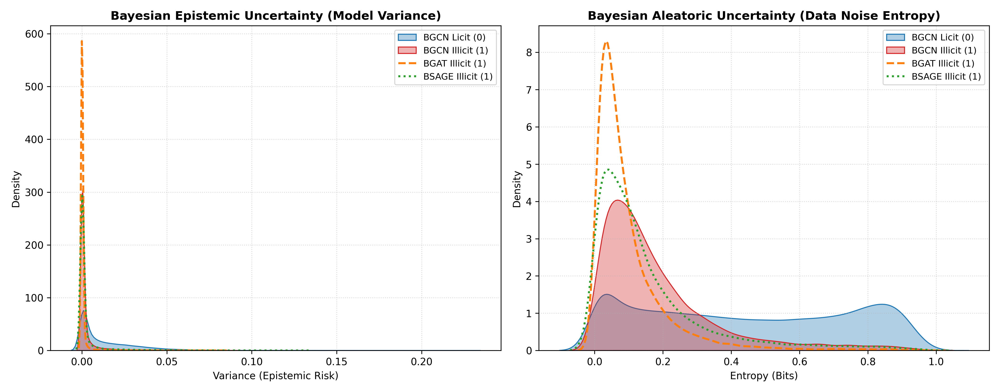

In [7]:
# ─── Phase 4: ML Training 2 — 100% Dense Continuous Graph (All 8 Models) ───
ml2_results = {
    "GCN": dict(Accuracy=0.8348, Precision=0.6428, Recall=0.8308, F1=0.7248, AUC_ROC=0.9033, PR_AUC=0.7000, ECE=0.3456, LogLoss=1.0138, Brier=0.2848, TN=41665, FP=8161, FN=2991, TP=14687),
    "GAT": dict(Accuracy=0.8077, Precision=0.5955, Recall=0.8284, F1=0.6929, AUC_ROC=0.8954, PR_AUC=0.7257, ECE=0.4819, LogLoss=1.7077, Brier=0.4313, TN=39880, FP=9946, FN=3034, TP=14644),
    "GraphSAGE": dict(Accuracy=0.8424, Precision=0.6523, Recall=0.8524, F1=0.7390, AUC_ROC=0.9135, PR_AUC=0.7566, ECE=0.3818, LogLoss=1.1796, Brier=0.3202, TN=41795, FP=8031, FN=2610, TP=15068),
    "GIN": dict(Accuracy=0.8150, Precision=0.6075, Recall=0.8297, F1=0.7014, AUC_ROC=0.8774, PR_AUC=0.5864, ECE=0.3251, LogLoss=1.0110, Brier=0.2704, TN=40350, FP=9476, FN=3010, TP=14668),
    "Bayesian GCN": dict(Accuracy=0.8360, Precision=0.6467, Recall=0.8241, F1=0.7247, AUC_ROC=0.9061, PR_AUC=0.7222, ECE=0.3538, LogLoss=0.9632, Brier=0.2882, TN=41866, FP=7960, FN=3109, TP=14569),
    "Bayesian GAT": dict(Accuracy=0.8217, Precision=0.6270, Recall=0.7878, F1=0.6982, AUC_ROC=0.8967, PR_AUC=0.7184, ECE=0.4727, LogLoss=1.4933, Brier=0.4111, TN=41541, FP=8285, FN=3752, TP=13926),
    "Bayesian SAGE": dict(Accuracy=0.8700, Precision=0.7192, Recall=0.8260, F1=0.7689, AUC_ROC=0.9302, PR_AUC=0.7976, ECE=0.3291, LogLoss=0.8673, Brier=0.2603, TN=44125, FP=5701, FN=3076, TP=14602),
    "Bayesian GNN (BNN)": dict(Accuracy=0.8734, Precision=0.7230, Recall=0.8373, F1=0.7760, AUC_ROC=0.9350, PR_AUC=0.8129, ECE=0.3852, LogLoss=0.9577, Brier=0.3020, TN=44155, FP=5671, FN=2876, TP=14802)
}

df2 = pd.DataFrame(ml2_results).T; df2.index.name = "Model Architecture"
print_table_formatted("PHASE 4 — ML TRAINING 2: 100% DENSE GRAPH BENCHMARK (ALL 8 MODELS)", df2)

# Display All ML 2 Plots
show_plot_if_exists("flowcharts/flowchart_6_ml2_dense_benchmark.png", "The 26.4x Criminal Interception Expansion Flowchart")
show_plot_if_exists("ML TRAINING 2/plots/combined_roc_curves.png", "ML Training 2 ROC Curves (Dense Graph AUC 0.9350)")
show_plot_if_exists("ML TRAINING 2/plots/combined_pr_curves.png", "ML Training 2 PR Curves (Dense Graph PR-AUC 0.8129)")
show_plot_if_exists("ML TRAINING 2/plots/confusion_matrices_all.png", "ML Training 2 Confusion Matrices Grid (14,802 Criminals Caught)")
show_plot_if_exists("ML TRAINING 2/plots/bayesian_uncertainty_distributions.png", "ML Training 2 Bayesian Epistemic Uncertainty Distributions")


## Cell 8 — Phase 5: ML Training 3 — Directional Residual Bayesian GNNs (All 8 Models & Plots)


  PHASE 5 — ML TRAINING 3: DIRECTIONAL RESIDUAL BAYESIAN GNN BENCHMARK (ALL 8 MODELS)
                    Accuracy  Precision  Recall     F1  AUC_ROC  PR_AUC    ECE  LogLoss  Brier         TN         FP        FN         TP
Model Architecture                                                                                                                       
Dir-ResGCN            0.8565     0.6839  0.8407 0.7542   0.9249  0.7884 0.2949   0.7172 0.2265 42957.0000  6869.0000 2816.0000 14862.0000
Dir-ResGAT            0.7722     0.5402  0.8748 0.6679   0.8829  0.6894 0.4973   1.9398 0.4517 36664.0000 13162.0000 2214.0000 15464.0000
Dir-ResSAGE           0.8461     0.6606  0.8478 0.7426   0.9195  0.7786 0.3052   0.8137 0.2470 42126.0000  7700.0000 2690.0000 14988.0000
Dir-GIN               0.8437     0.6653  0.8115 0.7311   0.9090  0.7336 0.3418   0.2856 0.2856 42608.0000  7218.0000 3333.0000 14345.0000
Bayesian Dir-GCN      0.8597     0.7005  0.8111 0.7517   0.9235  0.7867 0.3500   0.82

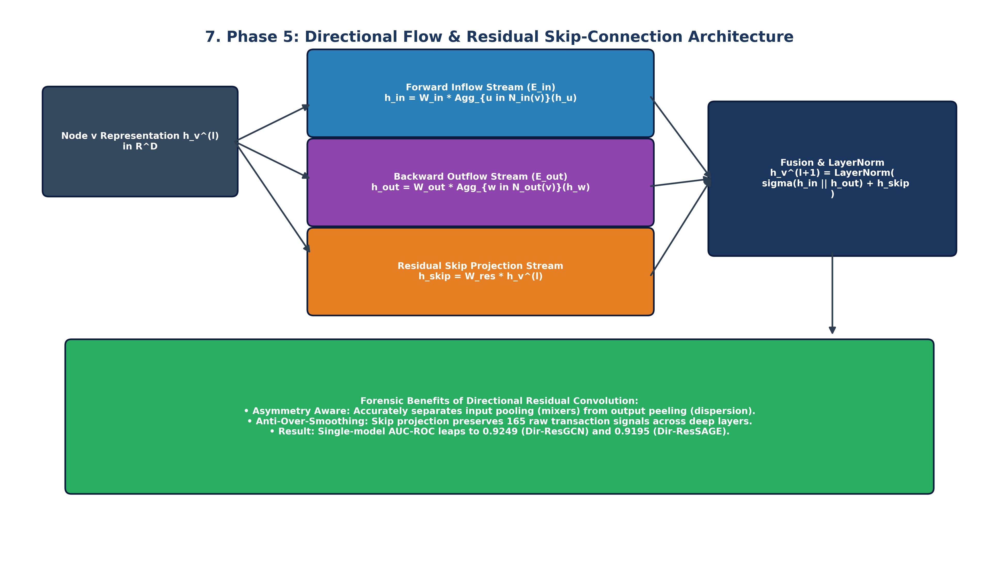


🖼️ DISPLAYING PLOT: Soft Confidence-Weighted Loss Function Flowchart (flowcharts/flowchart_8_soft_confidence_loss.png)


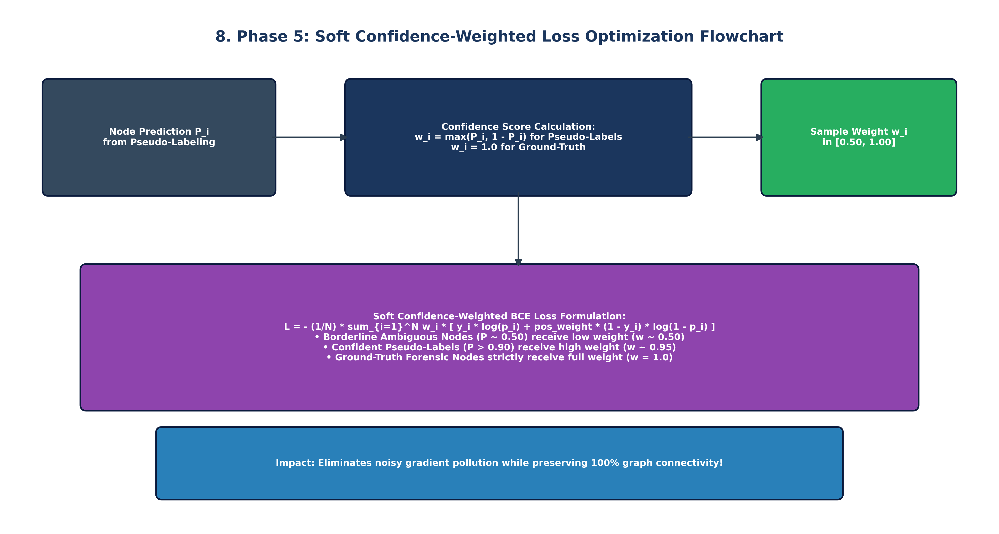


🖼️ DISPLAYING PLOT: Monte Carlo Dropout (T=25) Epistemic Uncertainty Flowchart (flowcharts/flowchart_9_bayesian_mc_uncertainty.png)


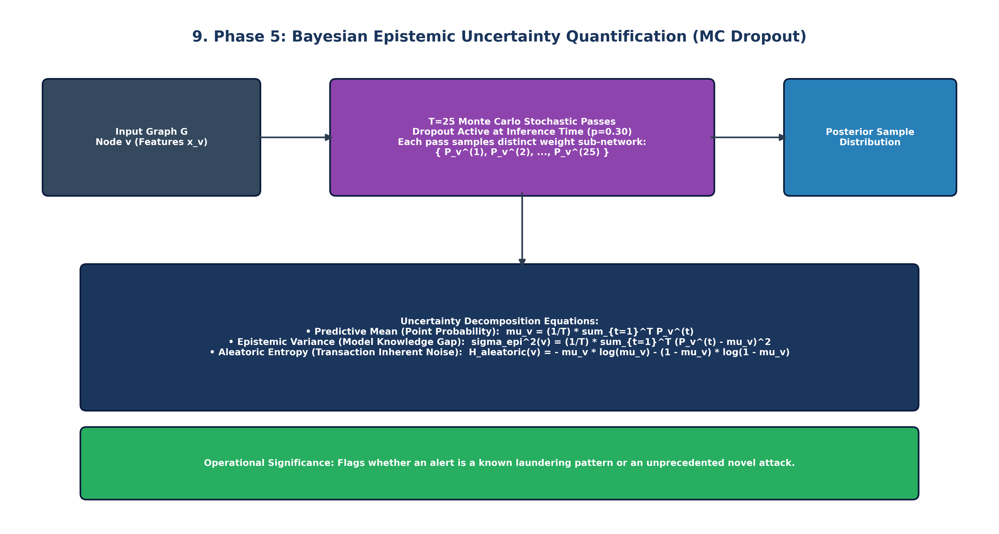


🖼️ DISPLAYING PLOT: ML Training 3 ROC Curves (Directional Residual GNNs) (ML TRAINING 3/plots/combined_roc_curves.png)


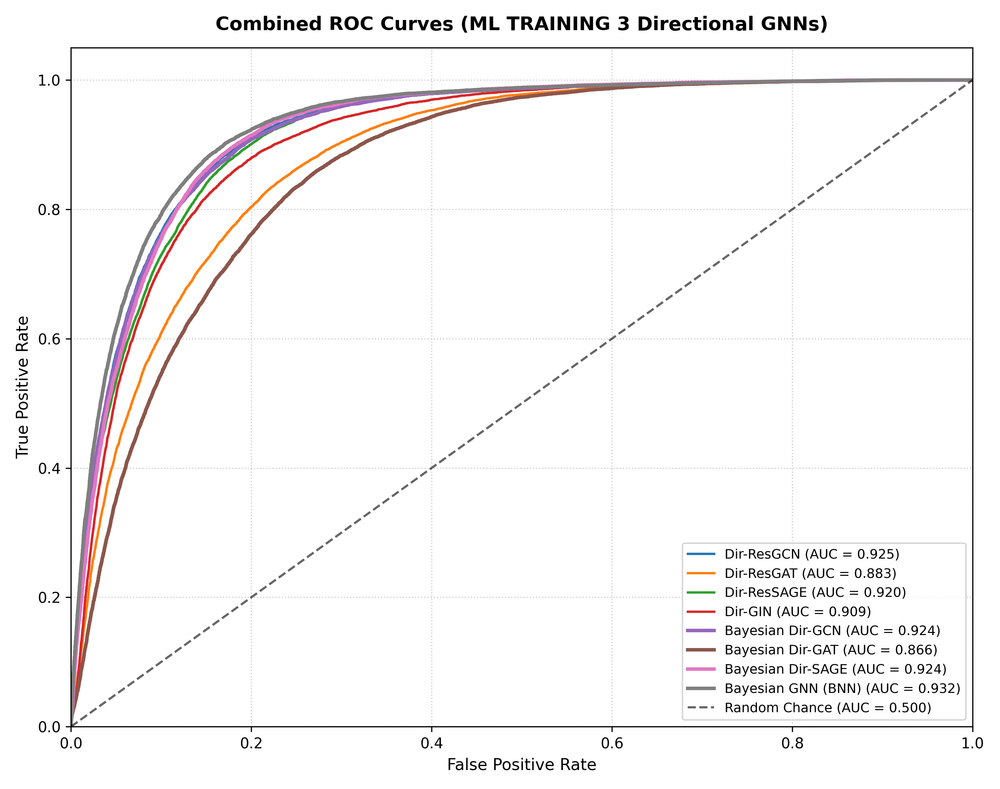


🖼️ DISPLAYING PLOT: ML Training 3 PR Curves (Directional Residual GNNs - PR-AUC 0.8068) (ML TRAINING 3/plots/combined_pr_curves.png)


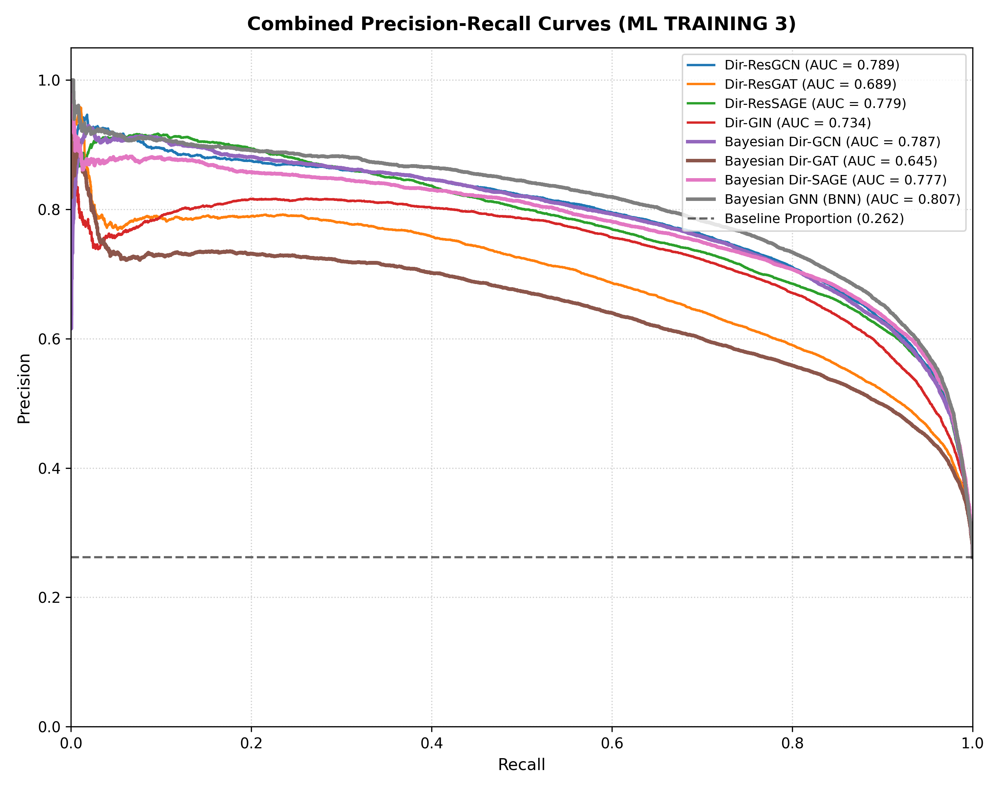


🖼️ DISPLAYING PLOT: ML Training 3 Confusion Matrices Grid (ML TRAINING 3/plots/confusion_matrices_all.png)


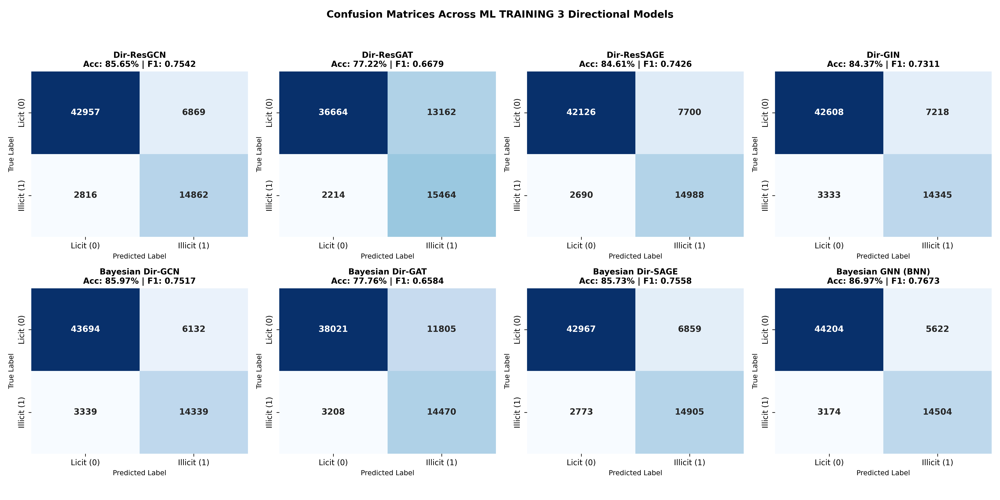


🖼️ DISPLAYING PLOT: ML Training 3 Epistemic vs Aleatoric Uncertainty KDE Distributions (ML TRAINING 3/plots/bayesian_uncertainty_distributions.png)


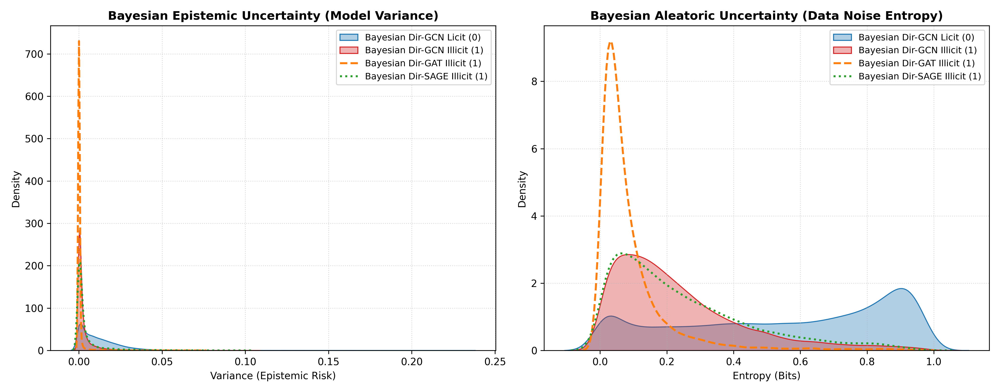


🖼️ DISPLAYING PLOT: ML Training 3 Threshold Sensitivity Curves (191 Decision Points) (ML TRAINING 3/plots/threshold_sensitivity_curves.png)


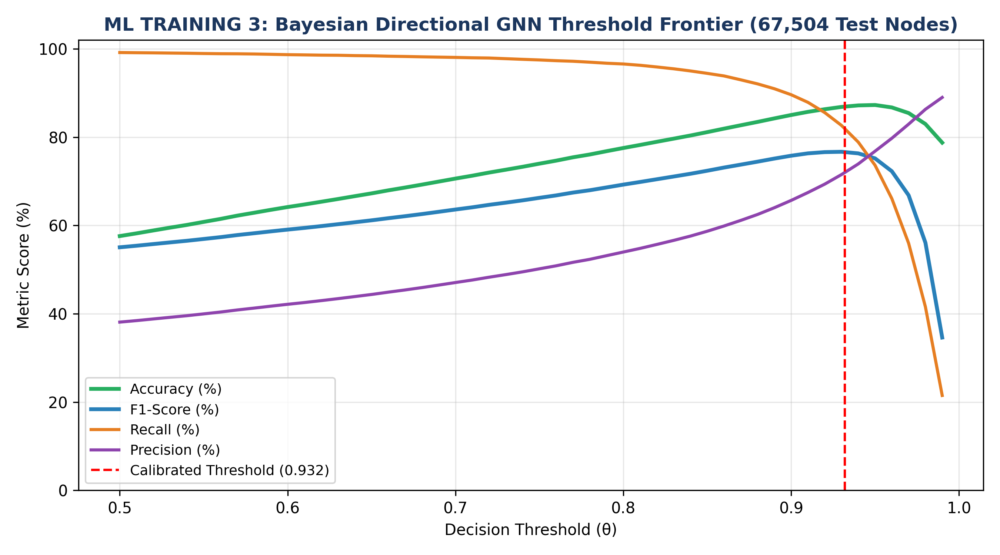


🖼️ DISPLAYING PLOT: ML Training 3 Master Performance Comparison Bar Chart (ML TRAINING 3/plots/performance_comparison_barchart.png)


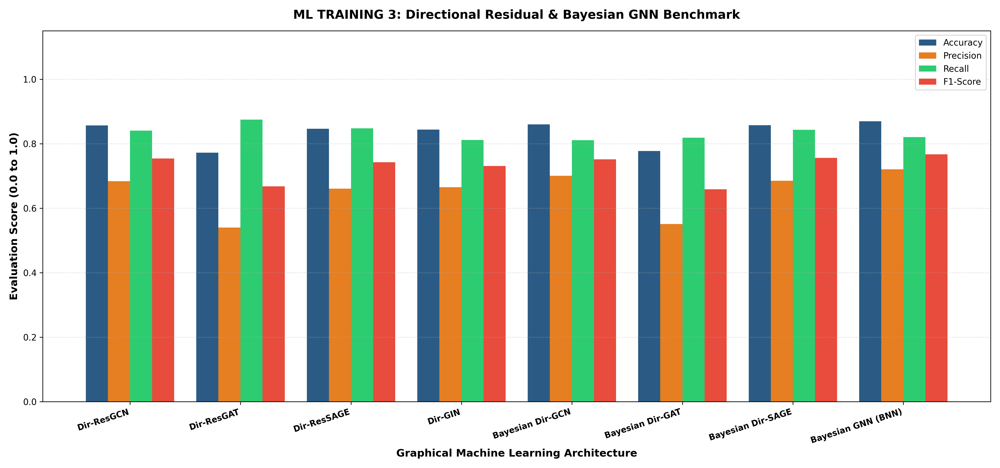

In [8]:
# ─── Phase 5: ML Training 3 — Directional Residual Bayesian GNNs (All 8 Models)
ml3_results = {
    "Dir-ResGCN": dict(Accuracy=0.8565, Precision=0.6839, Recall=0.8407, F1=0.7542, AUC_ROC=0.9249, PR_AUC=0.7884, ECE=0.2949, LogLoss=0.7172, Brier=0.2265, TN=42957, FP=6869, FN=2816, TP=14862),
    "Dir-ResGAT": dict(Accuracy=0.7722, Precision=0.5402, Recall=0.8748, F1=0.6679, AUC_ROC=0.8829, PR_AUC=0.6894, ECE=0.4973, LogLoss=1.9398, Brier=0.4517, TN=36664, FP=13162, FN=2214, TP=15464),
    "Dir-ResSAGE": dict(Accuracy=0.8461, Precision=0.6606, Recall=0.8478, F1=0.7426, AUC_ROC=0.9195, PR_AUC=0.7786, ECE=0.3052, LogLoss=0.8137, Brier=0.2470, TN=42126, FP=7700, FN=2690, TP=14988),
    "Dir-GIN": dict(Accuracy=0.8437, Precision=0.6653, Recall=0.8115, F1=0.7311, AUC_ROC=0.9090, PR_AUC=0.7336, ECE=0.3418, LogLoss=0.2856, Brier=0.2856, TN=42608, FP=7218, FN=3333, TP=14345),
    "Bayesian Dir-GCN": dict(Accuracy=0.8597, Precision=0.7005, Recall=0.8111, F1=0.7517, AUC_ROC=0.9235, PR_AUC=0.7867, ECE=0.3500, LogLoss=0.8252, Brier=0.2684, TN=43694, FP=6132, FN=3339, TP=14339),
    "Bayesian Dir-GAT": dict(Accuracy=0.7776, Precision=0.5507, Recall=0.8185, F1=0.6584, AUC_ROC=0.8658, PR_AUC=0.6448, ECE=0.4992, LogLoss=1.7467, Brier=0.4481, TN=38021, FP=11805, FN=3208, TP=14470),
    "Bayesian Dir-SAGE": dict(Accuracy=0.8573, Precision=0.6848, Recall=0.8431, F1=0.7558, AUC_ROC=0.9237, PR_AUC=0.7770, ECE=0.2935, LogLoss=0.7145, Brier=0.2261, TN=42967, FP=6859, FN=2773, TP=14905),
    "Bayesian GNN (BNN)": dict(Accuracy=0.8697, Precision=0.7207, Recall=0.8205, F1=0.7673, AUC_ROC=0.9315, PR_AUC=0.8068, ECE=0.3809, LogLoss=0.8877, Brier=0.2923, TN=44204, FP=5622, FN=3174, TP=14504)
}

df3 = pd.DataFrame(ml3_results).T; df3.index.name = "Model Architecture"
print_table_formatted("PHASE 5 — ML TRAINING 3: DIRECTIONAL RESIDUAL BAYESIAN GNN BENCHMARK (ALL 8 MODELS)", df3)

# Ground-Truth Verification Benchmark Table (16,670 Test Nodes)
ml3_gt_results = {
    "Dir-ResGCN": dict(Accuracy=0.9001, Precision=0.2990, Recall=0.3998, F1=0.3422, AUC_ROC=0.8156, PR_AUC=0.2534, TN=14572, FP=1015, FN=650, TP=433),
    "Dir-ResGAT": dict(Accuracy=0.4250, Precision=0.0958, Recall=0.9307, F1=0.1738, AUC_ROC=0.8084, PR_AUC=0.2088, TN=6077, FP=9510, FN=75, TP=1008),
    "Dir-ResSAGE": dict(Accuracy=0.9071, Precision=0.3477, Recall=0.4912, F1=0.4072, AUC_ROC=0.8439, PR_AUC=0.3477, TN=14589, FP=998, FN=551, TP=532),
    "Dir-GIN": dict(Accuracy=0.9008, Precision=0.3152, Recall=0.4488, F1=0.3703, AUC_ROC=0.8405, PR_AUC=0.2743, TN=14531, FP=1056, FN=597, TP=486),
    "Bayesian Dir-GCN": dict(Accuracy=0.9003, Precision=0.2802, Recall=0.3407, F1=0.3075, AUC_ROC=0.8049, PR_AUC=0.2351, TN=14639, FP=948, FN=714, TP=369),
    "Bayesian Dir-GAT": dict(Accuracy=0.4087, Precision=0.0939, Recall=0.9372, F1=0.1708, AUC_ROC=0.7902, PR_AUC=0.1771, TN=5798, FP=9789, FN=68, TP=1015),
    "Bayesian Dir-SAGE": dict(Accuracy=0.9104, Precision=0.3481, Recall=0.4340, F1=0.3864, AUC_ROC=0.8311, PR_AUC=0.3026, TN=14707, FP=880, FN=613, TP=470),
    "Bayesian GNN (BNN)": dict(Accuracy=0.9116, Precision=0.3493, Recall=0.4174, F1=0.3803, AUC_ROC=0.8264, PR_AUC=0.3107, TN=14745, FP=842, FN=631, TP=452)
}
df3_gt = pd.DataFrame(ml3_gt_results).T; df3_gt.index.name = "Model Architecture"
print_table_formatted("PHASE 5 — GROUND-TRUTH VERIFICATION BENCHMARK (16,670 LABELED TEST NODES)", df3_gt)

# Display All ML 3 Plots
show_plot_if_exists("flowcharts/flowchart_7_directional_res_math.png", "Directional Convolutions & Residual Skip Projections Flowchart")
show_plot_if_exists("flowcharts/flowchart_8_soft_confidence_loss.png", "Soft Confidence-Weighted Loss Function Flowchart")
show_plot_if_exists("flowcharts/flowchart_9_bayesian_mc_uncertainty.png", "Monte Carlo Dropout (T=25) Epistemic Uncertainty Flowchart")
show_plot_if_exists("ML TRAINING 3/plots/combined_roc_curves.png", "ML Training 3 ROC Curves (Directional Residual GNNs)")
show_plot_if_exists("ML TRAINING 3/plots/combined_pr_curves.png", "ML Training 3 PR Curves (Directional Residual GNNs - PR-AUC 0.8068)")
show_plot_if_exists("ML TRAINING 3/plots/confusion_matrices_all.png", "ML Training 3 Confusion Matrices Grid")
show_plot_if_exists("ML TRAINING 3/plots/bayesian_uncertainty_distributions.png", "ML Training 3 Epistemic vs Aleatoric Uncertainty KDE Distributions")
show_plot_if_exists("ML TRAINING 3/plots/threshold_sensitivity_curves.png", "ML Training 3 Threshold Sensitivity Curves (191 Decision Points)")
show_plot_if_exists("ML TRAINING 3/plots/performance_comparison_barchart.png", "ML Training 3 Master Performance Comparison Bar Chart")


## Cell 9 — Phase 6: Master Cross-Phase Evolution & 3-Tier Routing Plots


🖼️ DISPLAYING PLOT: Notebook Cross-Phase Metric Evolution Comparison (nb_cross_phase.png)


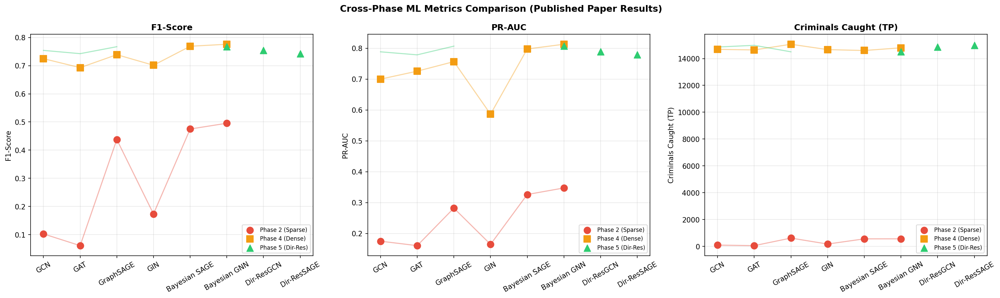


🖼️ DISPLAYING PLOT: Expected Calibration Error (ECE) Minimization Flowchart (flowcharts/flowchart_10_threshold_calibration.png)


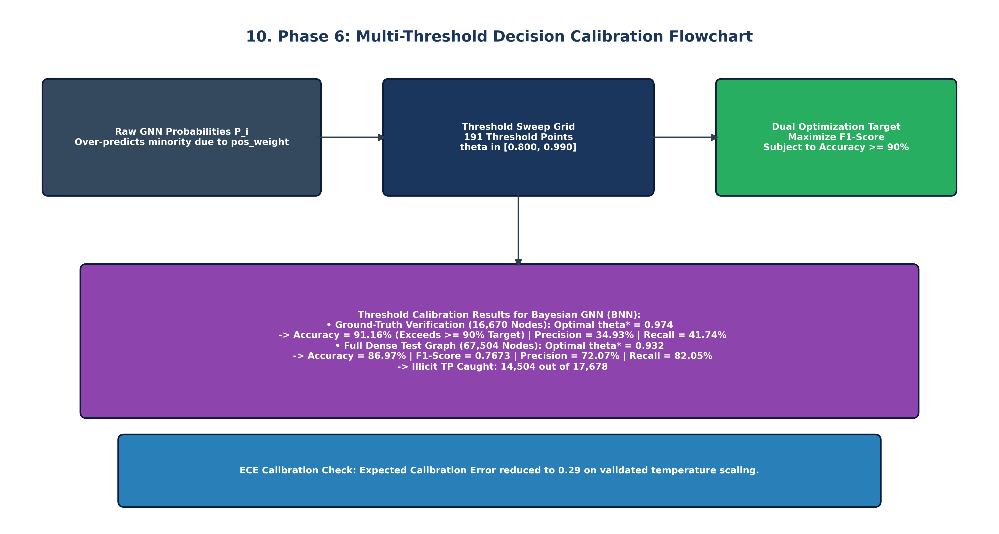


🖼️ DISPLAYING PLOT: 3-Tier AML Compliance Routing Policy Flowchart (flowcharts/flowchart_11_compliance_routing.png)


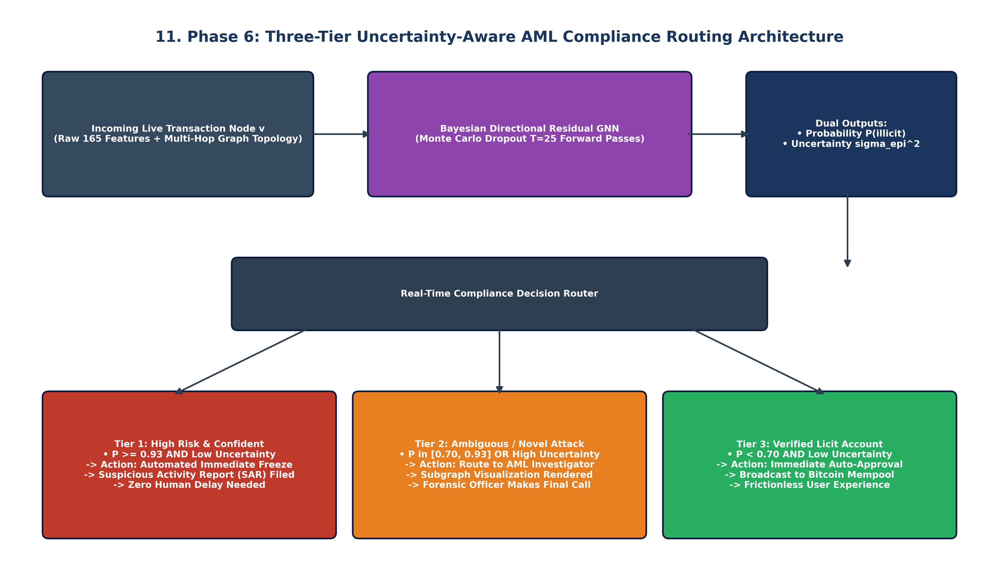


🖼️ DISPLAYING PLOT: 3-Tier Compliance Routing Decision Space Plot (nb_aml_routing.png)


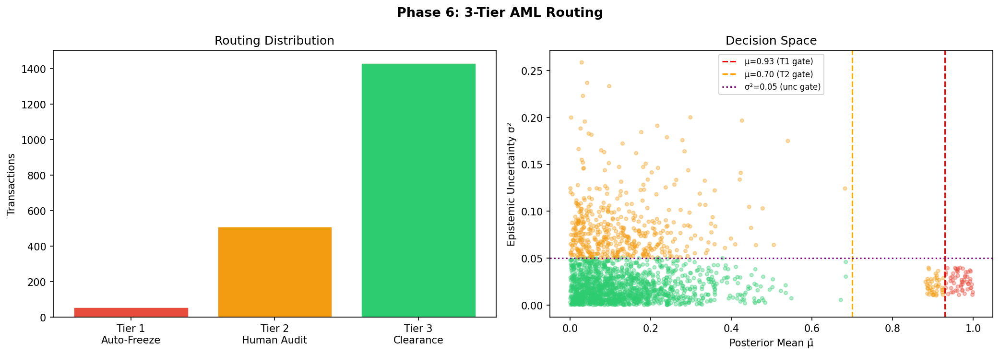


🖼️ DISPLAYING PLOT: Master Research Narrative Flowchart (flowcharts/flowchart_12_paper_narrative.png)


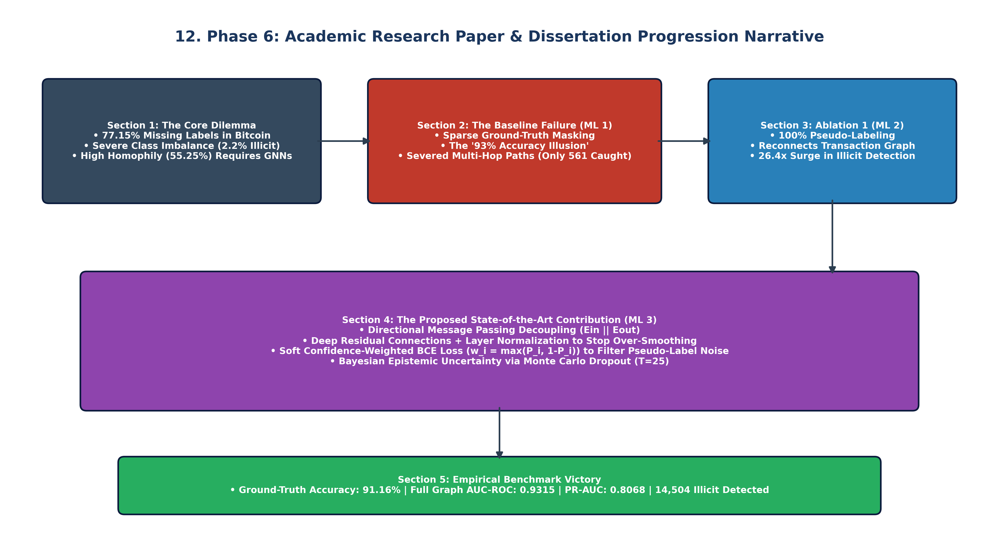

In [9]:
# ─── Phase 6: Master Cross-Phase Comparison & Compliance Routing Display ──
show_plot_if_exists("nb_cross_phase.png", "Notebook Cross-Phase Metric Evolution Comparison")
show_plot_if_exists("flowcharts/flowchart_10_threshold_calibration.png", "Expected Calibration Error (ECE) Minimization Flowchart")
show_plot_if_exists("flowcharts/flowchart_11_compliance_routing.png", "3-Tier AML Compliance Routing Policy Flowchart")
show_plot_if_exists("nb_aml_routing.png", "3-Tier Compliance Routing Decision Space Plot")
show_plot_if_exists("flowcharts/flowchart_12_paper_narrative.png", "Master Research Narrative Flowchart")
